# Deep Learning and Neural Network - Question 2
## Arian Firoozi - 810100196
## Arman Majidi - 810100205

# Outline
- [ 0 - Packages ](#0)
- [ 1 - Data Proprocessing ](#1)
- [ 2 - Implementation ](#2)
- [ 3 - Result Analysis ](#3)

---

<a name="0"></a>
## 0 - Packages 

First, let's run the cell below to import all the packages.
- [numpy](https://numpy.org) is the fundamental package for working with matrices in Python.
- [matplotlib](http://matplotlib.org) is a famous library to plot graphs in Python.
- [seanborn](https://seaborn.pydata.org) is a Python data visualization library based on matplotlib.
- [tensorflow](https://tensorflow.org) is an end-to-end platform for machine learning.
- [scikit-learn](https://scikit-learn.org) is a Python module for machine learning.
- [albumentations](https://albumentations.ai) is a computer vision tool that boosts the performance of deep convolutional neural networks.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import MobileNetV2, EfficientNetB6, NASNetMobile
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import confusion_matrix
import albumentations as A

from dataset_to_numpy import *
from show_random_images import *
from model_transfer_learning import *
from image_augmentation import *
from accuracy_loss_plot import *

---

<a name="1"></a>
## 1 - Data Preprocessing

In [2]:
dataset_path = "bean-leaf-dataset\\versions\\1"

In [3]:
img_size = (224, 224, 3)
batch_size = 32

train = tf.keras.preprocessing.image_dataset_from_directory(
    directory=f'{dataset_path}/train/train',
    batch_size=batch_size,
    image_size=img_size[:-1],
    label_mode='int',  # or 'categorical' for one-hot labels
)
validation = tf.keras.preprocessing.image_dataset_from_directory(
    directory=f'{dataset_path}/validation/validation',
    image_size=img_size[:-1],
    batch_size=batch_size,
    label_mode='int',
)

test = tf.keras.preprocessing.image_dataset_from_directory(
    directory=f'{dataset_path}/test/test',
    image_size=img_size[:-1],
    batch_size=batch_size,
    label_mode='int',
)
class_names = test.class_names

Found 1034 files belonging to 3 classes.
Found 133 files belonging to 3 classes.
Found 128 files belonging to 3 classes.


In [4]:
X_train, y_train = dataset_to_numpy(train)
X_val, y_val = dataset_to_numpy(validation)
X_test, y_test = dataset_to_numpy(test)

In [5]:
print(f'Classes in oreder (0 to 2): {class_names}\n')
print(f'X_train shape: {X_train.shape}\ny_train shape: {X_train.shape}\n')
print(f'X_validation shape: {X_val.shape}\ny_validation shape: {y_val.shape}\n')
print(f'X_test shape: {X_test.shape}\ny_test shape: {y_test.shape}')

Classes in oreder (0 to 2): ['angular_leaf_spot', 'bean_rust', 'healthy']

X_train shape: (1034, 224, 224, 3)
y_train shape: (1034, 224, 224, 3)

X_validation shape: (133, 224, 224, 3)
y_validation shape: (133,)

X_test shape: (128, 224, 224, 3)
y_test shape: (128,)


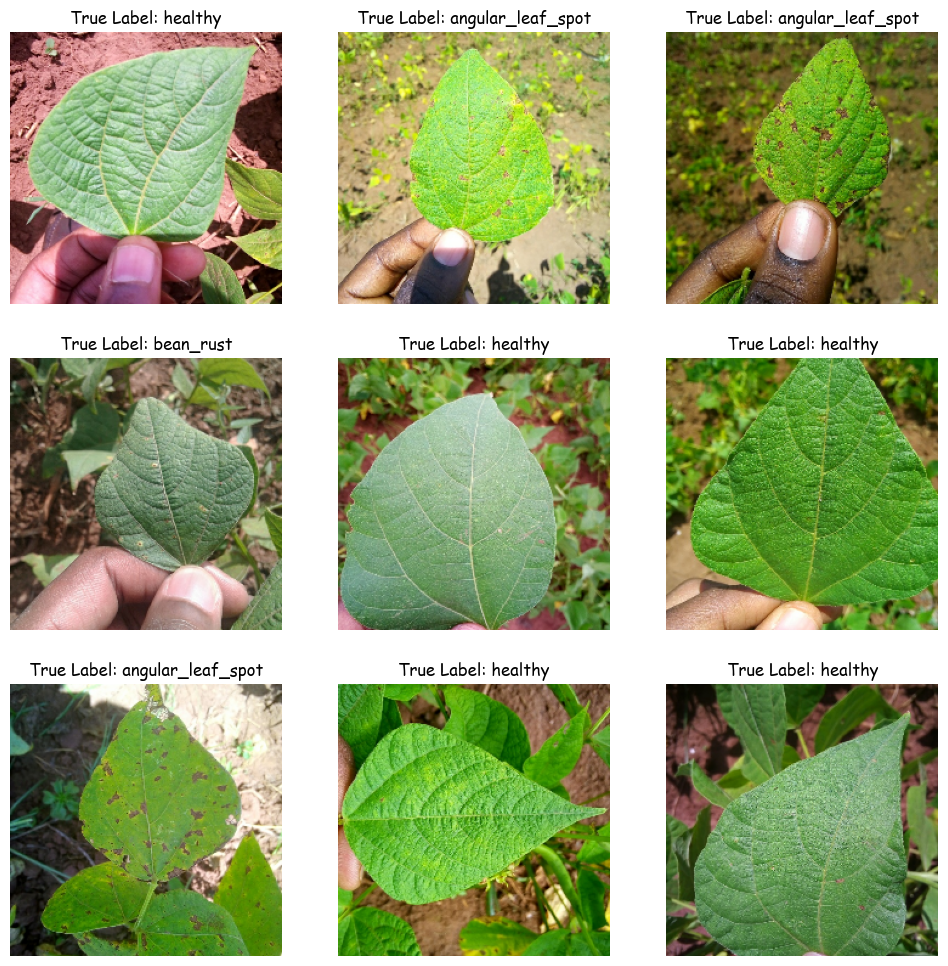

In [6]:
show_random_images(class_names, X_train, y_train, num_images=9)

**<span style="color:red">Note: <span style="color:black">After checking pictures, I find that 1 picture in healty class is missing (according to paper numbers)</span>**

---

<a name="2"></a>
## 2 - Implementation

### 2.1 - Model selecting

#### ◆ MobileNetV2

In [7]:
mobileNetV2 = MobileNetV2(include_top=False, input_shape=img_size, weights='imagenet')
mobileNetV2.summary()

Model: "mobilenetv2_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1 (Conv2D)                │ (None, 112, 112, 32)      │             864 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ bn_Conv1 (BatchNormalization) │ (None, 112, 112, 32)      │             128 │ Conv1[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1_relu (ReLU)             │ (None, 112, 112, 32)      │               0 │ bn_Conv1[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise       │ (None, 112, 112, 32)      │             288 │ Conv1_relu[0][0]           │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_BN    │ (None, 112, 112, 32)      │             128 │ expanded_conv_depthwise[0… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_relu  │ (None, 112, 112, 32)      │               0 │ expanded_conv_depthwise_B… │
│ (ReLU)                        │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project         │ (None, 112, 112, 16)      │             512 │ expanded_conv_depthwise_r… │
│ (Conv2D)                      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project_BN      │ (None, 112, 112, 16)      │              64 │ expanded_conv_project[0][… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand (Conv2D)       │ (None, 112, 112, 96)      │           1,536 │ expanded_conv_project_BN[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_BN             │ (None, 112, 112, 96)      │             384 │ block_1_expand[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_relu (ReLU)    │ (None, 112, 112, 96)      │               0 │ block_1_expand_BN[0][0]    │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_pad (ZeroPadding2D)   │ (None, 113, 113, 96)      │               0 │ block_1_expand_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_depthwise             │ (None, 56, 56, 96)        │             864 │ block_1_pad[0][0]          │
│ (DepthwiseConv2D)             │                           │               

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 2,223,872 (8.48 MB)

 Non-trainable params: 34,112 (133.25 KB)

#### ◆ EfficientNetB6

In [8]:
efficientNetB6 = EfficientNetB6(include_top=False, input_shape=img_size, weights='imagenet')
efficientNetB6.summary()

Model: "efficientnetb6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)    │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ rescaling (Rescaling)         │ (None, 224, 224, 3)       │               0 │ input_layer_1[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ normalization (Normalization) │ (None, 224, 224, 3)       │               7 │ rescaling[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ rescaling_1 (Rescaling)       │ (None, 224, 224, 3)       │               0 │ normalization[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_conv_pad (ZeroPadding2D) │ (None, 225, 225, 3)       │               0 │ rescaling_1[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_conv (Conv2D)            │ (None, 112, 112, 56)      │           1,512 │ stem_conv_pad[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_bn (BatchNormalization)  │ (None, 112, 112, 56)      │             224 │ stem_conv[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_activation (Activation)  │ (None, 112, 112, 56)      │               0 │ stem_bn[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_dwconv                │ (None, 112, 112, 56)      │             504 │ stem_activation[0][0]      │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_bn                    │ (None, 112, 112, 56)      │             224 │ block1a_dwconv[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_activation            │ (None, 112, 112, 56)      │               0 │ block1a_bn[0][0]           │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_squeeze            │ (None, 56)                │               0 │ block1a_activation[0][0]   │
│ (GlobalAveragePooling2D)      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_reshape (Reshape)  │ (None, 1, 1, 56)          │               0 │ block1a_se_squeeze[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_reduce (Conv2D)    │ (None, 1, 1, 14)          │             798 │ block1a_se_reshape[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_expand (Conv2D)    │ (None, 1, 1, 56)          │             840 │ block1a_se_reduce[0][0]    │
├───────────────────────────────┼───────────────────────────┼───────────────

 Total params: 40,960,143 (156.25 MB)

 Trainable params: 40,735,704 (155.39 MB)

 Non-trainable params: 224,439 (876.72 KB)

#### ◆ NasNet

In [9]:
nasNet = NASNetMobile(include_top=False, input_shape=img_size, weights='imagenet')
nasNet.summary()

Model: "nasnet_mobile"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)    │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_conv1 (Conv2D)           │ (None, 111, 111, 32)      │             864 │ input_layer_2[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_bn1 (BatchNormalization) │ (None, 111, 111, 32)      │             128 │ stem_conv1[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation (Activation)       │ (None, 111, 111, 32)      │               0 │ stem_bn1[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ reduction_conv_1_stem_1       │ (None, 111, 111, 11)      │             352 │ activation[0][0]           │
│ (Conv2D)                      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ reduction_bn_1_stem_1         │ (None, 111, 111, 11)      │              44 │ reduction_conv_1_stem_1[0… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation_1 (Activation)     │ (None, 111, 111, 11)      │               0 │ reduction_bn_1_stem_1[0][… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation_3 (Activation)     │ (None, 111, 111, 32)      │               0 │ stem_bn1[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ separable_conv_1_pad_reducti… │ (None, 115, 115, 11)      │               0 │ activation_1[0][0]         │
│ (ZeroPadding2D)               │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ separable_conv_1_pad_reducti… │ (None, 117, 117, 32)      │               0 │ activation_3[0][0]         │
│ (ZeroPadding2D)               │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ separable_conv_1_reduction_l… │ (None, 56, 56, 11)        │             396 │ separable_conv_1_pad_redu… │
│ (SeparableConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ separable_conv_1_reduction_r… │ (None, 56, 56, 11)        │           1,920 │ separable_conv_1_pad_redu… │
│ (SeparableConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ separable_conv_1_bn_reductio… │ (None, 56, 56, 11)        │              44 │ separable_conv_1_reductio… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ separable_conv_1_bn_reductio… │ (None, 56, 56, 11)        │              4

 Total params: 4,269,716 (16.29 MB)

 Trainable params: 4,232,978 (16.15 MB)

 Non-trainable params: 36,738 (143.51 KB)

### 2.2 - Data Augmentation

In [10]:
transform = A.Compose([
    A.RandomRotate90(p=0.5),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
    A.HueSaturationValue(p=0.3),
    A.CLAHE(p=0.2),
])

In [11]:
num_augmentations = 1
X_train, y_train = image_augmentation(X_train, y_train, transform, num_augmentations=num_augmentations)

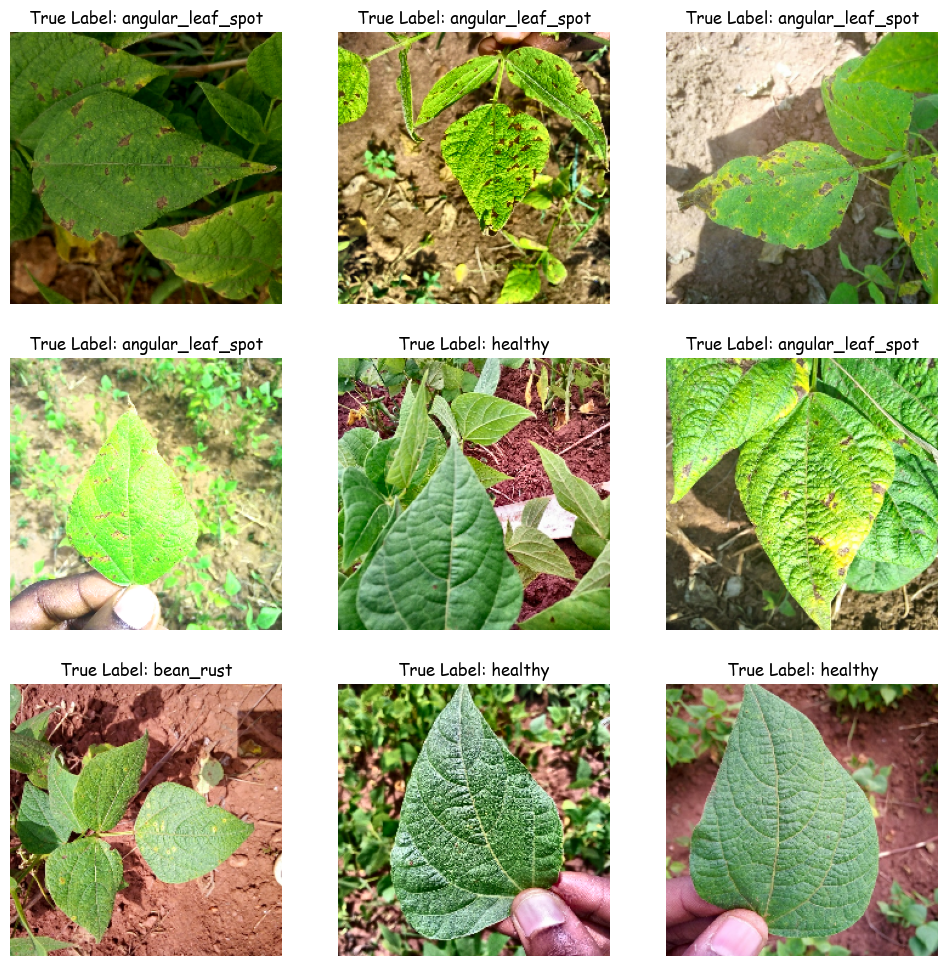

In [12]:
show_random_images(class_names, X_train, y_train, num_images=9)

### 2.3 - Data Augmentation

In [13]:
learning_rate = 0.001
batch_size = 32
epoches = 25
dropout_rate = 0.3
'''
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=7,
    mode='min',
    restore_best_weights=True
)
'''

"\nearly_stopping = EarlyStopping(\n    monitor='val_loss',\n    patience=7,\n    mode='min',\n    restore_best_weights=True\n)\n"

In [14]:
mobileNetV2 = model_transfer_learning(mobileNetV2, dropout_rate=dropout_rate)
efficientNetB6 = model_transfer_learning(efficientNetB6, dropout_rate=dropout_rate)
nasNet = model_transfer_learning(nasNet, dropout_rate=dropout_rate)

In [15]:
initial_weightsMobileNetV2 = mobileNetV2.get_weights()
initial_weightsEfficientNetB6 = efficientNetB6.get_weights()
initial_weightsNasNet = nasNet.get_weights()

### 2.4, 2.5 - Optimizers and Model Training

#### ◆ MobileNet

In [16]:
X_train = (X_train / 255).astype(np.float32)
X_val = (X_val / 255).astype(np.float32)

##### Adam Optimizer

In [17]:
mobileNetV2.set_weights(initial_weightsMobileNetV2)
mobileNetV2.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
                    loss='sparse_categorical_crossentropy',
                    metrics=['accuracy'])
histAdamMobileNetV2 = mobileNetV2.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epoches, batch_size=batch_size)

Epoch 1/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 32s 800ms/step - accuracy: 0.5922 - loss: 0.9662 - val_accuracy: 0.8045 - val_loss: 0.4129
Epoch 2/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 26s 801ms/step - accuracy: 0.7983 - loss: 0.4558 - val_accuracy: 0.9023 - val_loss: 0.2880
Epoch 3/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 25s 757ms/step - accuracy: 0.8576 - loss: 0.3345 - val_accuracy: 0.9173 - val_loss: 0.2254
Epoch 4/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 24s 735ms/step - accuracy: 0.8920 - loss: 0.2506 - val_accuracy: 0.8872 - val_loss: 0.2453
Epoch 5/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 23s 705ms/step - accuracy: 0.8983 - loss: 0.2686 - val_accuracy: 0.9248 - val_loss: 0.2262
Epoch 6/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 22s 668ms/step - accuracy: 0.8994 - loss: 0.2260 - val_accuracy: 0.9248 - val_loss: 0.2050
Epoch 7/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 22s 676ms/step - accuracy: 0.9273 - loss: 0.1879 - val_accuracy: 0.9323 - val_loss: 0.2126
Epoch 8/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 24s 718ms/step - accuracy: 0.9138 - loss: 0.1906 - val_accu

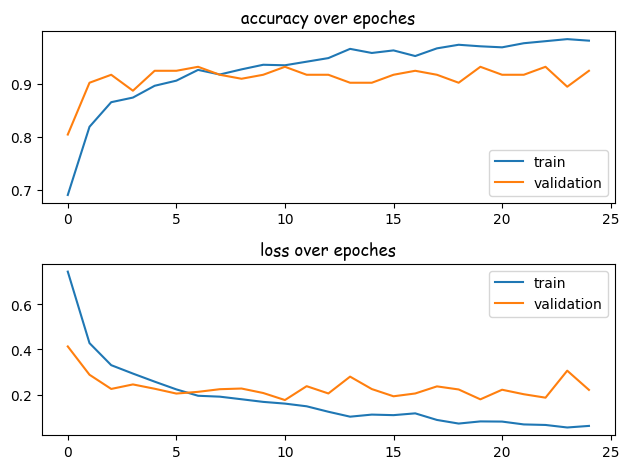

In [18]:
accuracy_loss_plot(histAdamMobileNetV2)

##### Nadam Optimizer

In [19]:
mobileNetV2.set_weights(initial_weightsMobileNetV2)
mobileNetV2.compile(optimizer=keras.optimizers.Nadam(learning_rate=learning_rate),
                    loss='sparse_categorical_crossentropy',
                    metrics=['accuracy'])
histNadamMobileNetV2 = mobileNetV2.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epoches, batch_size=batch_size)

Epoch 1/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 30s 729ms/step - accuracy: 0.5441 - loss: 1.0985 - val_accuracy: 0.8421 - val_loss: 0.3543
Epoch 2/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 24s 728ms/step - accuracy: 0.8291 - loss: 0.4240 - val_accuracy: 0.9023 - val_loss: 0.2731
Epoch 3/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 25s 767ms/step - accuracy: 0.8545 - loss: 0.3360 - val_accuracy: 0.9098 - val_loss: 0.2305
Epoch 4/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 24s 737ms/step - accuracy: 0.9083 - loss: 0.2521 - val_accuracy: 0.9323 - val_loss: 0.2015
Epoch 5/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 24s 718ms/step - accuracy: 0.9091 - loss: 0.2277 - val_accuracy: 0.9098 - val_loss: 0.2448
Epoch 6/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 23s 707ms/step - accuracy: 0.9170 - loss: 0.2171 - val_accuracy: 0.9248 - val_loss: 0.1803
Epoch 7/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 22s 675ms/step - accuracy: 0.9254 - loss: 0.2010 - val_accuracy: 0.9398 - val_loss: 0.1722
Epoch 8/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 26s 772ms/step - accuracy: 0.9104 - loss: 0.2154 - val_accu

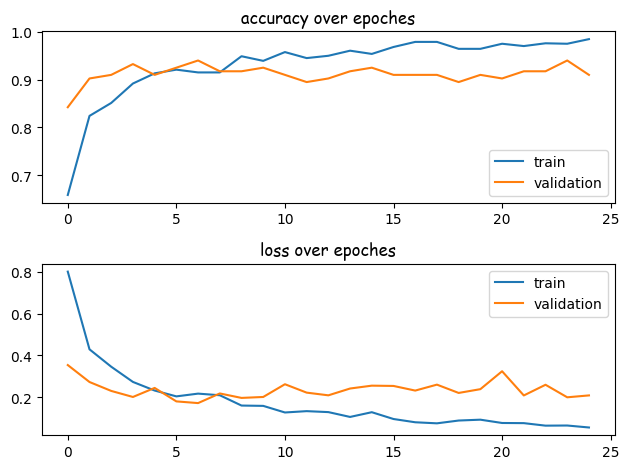

In [20]:
accuracy_loss_plot(histNadamMobileNetV2)

##### RMSprop Optimizer

In [21]:
mobileNetV2.set_weights(initial_weightsMobileNetV2)
mobileNetV2.compile(optimizer=keras.optimizers.RMSprop(learning_rate=learning_rate),
                    loss='sparse_categorical_crossentropy',
                    metrics=['accuracy'])
histRMSpropMobileNetV2 = mobileNetV2.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epoches, batch_size=batch_size)

Epoch 1/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 30s 742ms/step - accuracy: 0.5578 - loss: 1.9070 - val_accuracy: 0.4812 - val_loss: 1.3326
Epoch 2/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 23s 696ms/step - accuracy: 0.7368 - loss: 0.5963 - val_accuracy: 0.8797 - val_loss: 0.3275
Epoch 3/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 23s 686ms/step - accuracy: 0.8144 - loss: 0.4301 - val_accuracy: 0.8872 - val_loss: 0.3162
Epoch 4/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 23s 689ms/step - accuracy: 0.8509 - loss: 0.3529 - val_accuracy: 0.8722 - val_loss: 0.2818
Epoch 5/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 23s 702ms/step - accuracy: 0.8779 - loss: 0.3400 - val_accuracy: 0.7744 - val_loss: 0.4871
Epoch 6/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 23s 690ms/step - accuracy: 0.8810 - loss: 0.2975 - val_accuracy: 0.9173 - val_loss: 0.2510
Epoch 7/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 23s 692ms/step - accuracy: 0.8903 - loss: 0.2777 - val_accuracy: 0.8571 - val_loss: 0.4646
Epoch 8/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 23s 695ms/step - accuracy: 0.9126 - loss: 0.2514 - val_accu

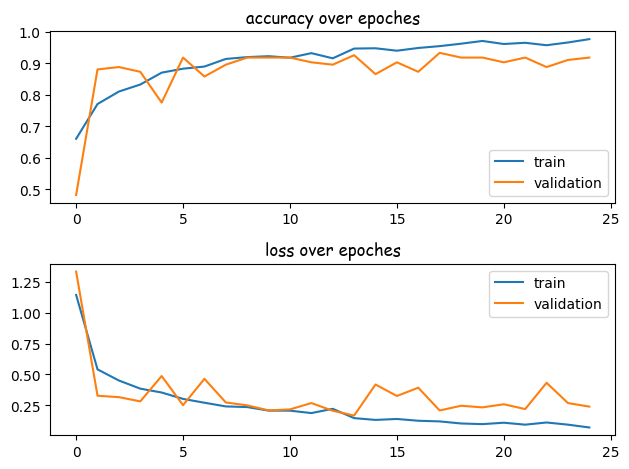

In [22]:
accuracy_loss_plot(histRMSpropMobileNetV2)

#### ◆ EfficientNetB6

In [23]:
X_train = (X_train * 255).astype(np.uint8)
X_val = (X_val * 255).astype(np.uint8)

##### Adam Optimizer

In [24]:
efficientNetB6.set_weights(initial_weightsEfficientNetB6)
efficientNetB6.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
                       loss='sparse_categorical_crossentropy',
                       metrics=['accuracy'])
histAdamEfficientNetB6 = efficientNetB6.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epoches, batch_size=batch_size)

Epoch 1/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 184s 5s/step - accuracy: 0.6177 - loss: 0.8327 - val_accuracy: 0.8045 - val_loss: 0.4946
Epoch 2/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 147s 4s/step - accuracy: 0.8284 - loss: 0.4431 - val_accuracy: 0.8722 - val_loss: 0.3409
Epoch 3/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 151s 5s/step - accuracy: 0.8551 - loss: 0.3568 - val_accuracy: 0.8797 - val_loss: 0.3141
Epoch 4/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 149s 5s/step - accuracy: 0.8651 - loss: 0.3403 - val_accuracy: 0.8947 - val_loss: 0.2974
Epoch 5/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 159s 5s/step - accuracy: 0.8988 - loss: 0.2822 - val_accuracy: 0.8947 - val_loss: 0.2885
Epoch 6/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 152s 5s/step - accuracy: 0.8764 - loss: 0.3019 - val_accuracy: 0.8722 - val_loss: 0.2974
Epoch 7/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 139s 4s/step - accuracy: 0.9122 - loss: 0.2467 - val_accuracy: 0.8571 - val_loss: 0.2929
Epoch 8/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 157s 5s/step - accuracy: 0.9097 - loss: 0.2279 - val_accuracy: 0.8947 - v

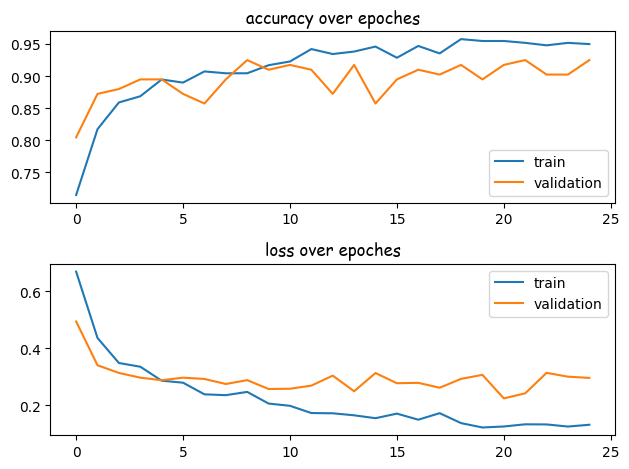

In [25]:
accuracy_loss_plot(histAdamEfficientNetB6)

##### Nadam Optimizer

In [26]:
efficientNetB6.set_weights(initial_weightsEfficientNetB6)
efficientNetB6.compile(optimizer=keras.optimizers.Nadam(learning_rate=learning_rate),
                       loss='sparse_categorical_crossentropy',
                       metrics=['accuracy'])
histNadamEfficientNetB6 = efficientNetB6.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epoches, batch_size=batch_size)

Epoch 1/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 197s 5s/step - accuracy: 0.5795 - loss: 0.8718 - val_accuracy: 0.8045 - val_loss: 0.4757
Epoch 2/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 137s 4s/step - accuracy: 0.8092 - loss: 0.4505 - val_accuracy: 0.8195 - val_loss: 0.4478
Epoch 3/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 138s 4s/step - accuracy: 0.8570 - loss: 0.3658 - val_accuracy: 0.8647 - val_loss: 0.3084
Epoch 4/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 137s 4s/step - accuracy: 0.8742 - loss: 0.3298 - val_accuracy: 0.9023 - val_loss: 0.3113
Epoch 5/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 143s 4s/step - accuracy: 0.8827 - loss: 0.2844 - val_accuracy: 0.8647 - val_loss: 0.3107
Epoch 6/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 142s 4s/step - accuracy: 0.9030 - loss: 0.2758 - val_accuracy: 0.8947 - val_loss: 0.2898
Epoch 7/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 137s 4s/step - accuracy: 0.9131 - loss: 0.2265 - val_accuracy: 0.9023 - val_loss: 0.2857
Epoch 8/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 138s 4s/step - accuracy: 0.9248 - loss: 0.2174 - val_accuracy: 0.9023 - v

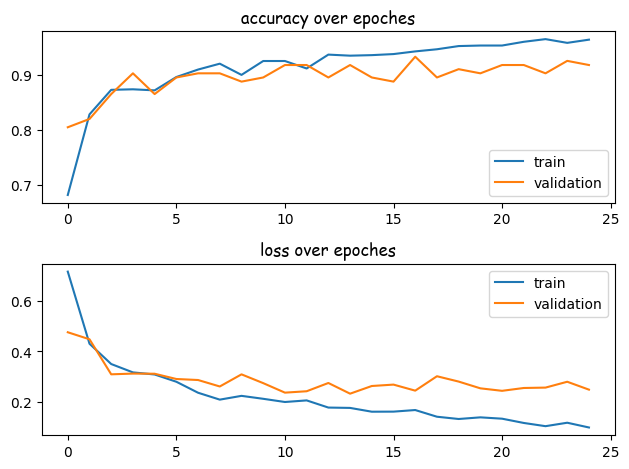

In [27]:
accuracy_loss_plot(histNadamEfficientNetB6)

##### RMSprop Optimizer

In [28]:
efficientNetB6.set_weights(initial_weightsEfficientNetB6)
efficientNetB6.compile(optimizer=keras.optimizers.RMSprop(learning_rate=learning_rate),
                       loss='sparse_categorical_crossentropy',
                       metrics=['accuracy'])
histRMSpropEfficientNetB6 = efficientNetB6.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epoches, batch_size=batch_size)

Epoch 1/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 179s 4s/step - accuracy: 0.5335 - loss: 1.0092 - val_accuracy: 0.8120 - val_loss: 0.4743
Epoch 2/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 139s 4s/step - accuracy: 0.8203 - loss: 0.4920 - val_accuracy: 0.6767 - val_loss: 0.7209
Epoch 3/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 142s 4s/step - accuracy: 0.8201 - loss: 0.4949 - val_accuracy: 0.8346 - val_loss: 0.3889
Epoch 4/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 146s 4s/step - accuracy: 0.8507 - loss: 0.3935 - val_accuracy: 0.8421 - val_loss: 0.4412
Epoch 5/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 139s 4s/step - accuracy: 0.8606 - loss: 0.3509 - val_accuracy: 0.8346 - val_loss: 0.3662
Epoch 6/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 140s 4s/step - accuracy: 0.8805 - loss: 0.3085 - val_accuracy: 0.8872 - val_loss: 0.3107
Epoch 7/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 139s 4s/step - accuracy: 0.8900 - loss: 0.3027 - val_accuracy: 0.8947 - val_loss: 0.3131
Epoch 8/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 140s 4s/step - accuracy: 0.8909 - loss: 0.2552 - val_accuracy: 0.7669 - v

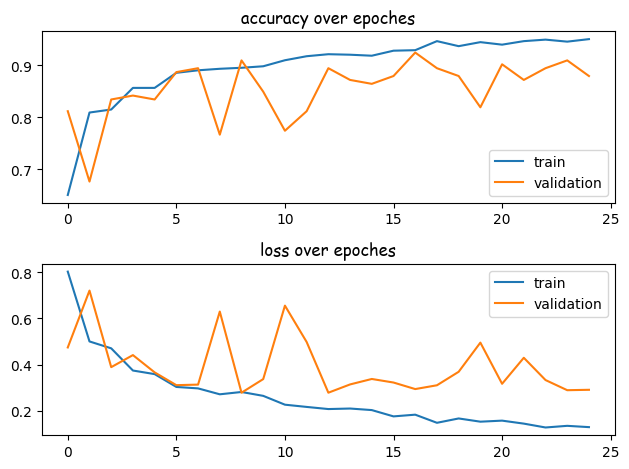

In [29]:
accuracy_loss_plot(histRMSpropEfficientNetB6)

#### ◆ NasNet

In [30]:
X_train = (X_train / 255).astype(np.float32)
X_val = (X_val / 255).astype(np.float32)

##### Adam Optimizer

In [31]:
nasNet.set_weights(initial_weightsNasNet)
nasNet.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
               loss='sparse_categorical_crossentropy',
               metrics=['accuracy'])
histAdamNasNet = nasNet.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epoches, batch_size=batch_size)

Epoch 1/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 53s 922ms/step - accuracy: 0.5135 - loss: 1.0832 - val_accuracy: 0.7820 - val_loss: 0.5771
Epoch 2/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 24s 734ms/step - accuracy: 0.7503 - loss: 0.6250 - val_accuracy: 0.7519 - val_loss: 0.5563
Epoch 3/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 25s 744ms/step - accuracy: 0.7776 - loss: 0.5453 - val_accuracy: 0.7970 - val_loss: 0.5134
Epoch 4/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 25s 768ms/step - accuracy: 0.7842 - loss: 0.5141 - val_accuracy: 0.8571 - val_loss: 0.4229
Epoch 5/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 25s 751ms/step - accuracy: 0.8045 - loss: 0.4415 - val_accuracy: 0.8647 - val_loss: 0.4429
Epoch 6/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 24s 738ms/step - accuracy: 0.8417 - loss: 0.4069 - val_accuracy: 0.8647 - val_loss: 0.4026
Epoch 7/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 24s 731ms/step - accuracy: 0.8663 - loss: 0.3695 - val_accuracy: 0.8647 - val_loss: 0.4433
Epoch 8/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 24s 727ms/step - accuracy: 0.8420 - loss: 0.3651 - val_accu

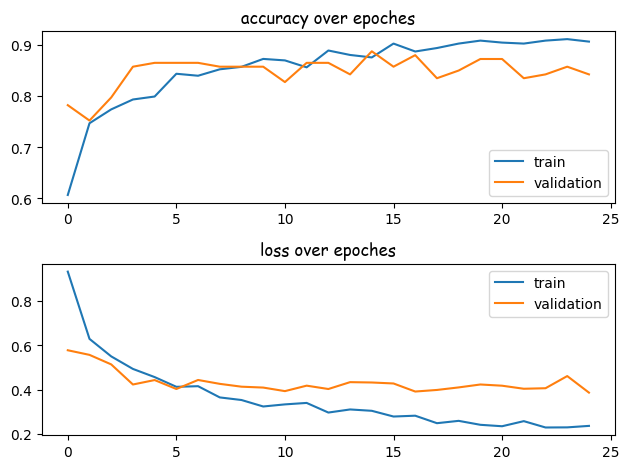

In [32]:
accuracy_loss_plot(histAdamNasNet)

##### Nadam Optimizer

In [33]:
nasNet.set_weights(initial_weightsNasNet)
nasNet.compile(optimizer=keras.optimizers.Nadam(learning_rate=learning_rate),
               loss='sparse_categorical_crossentropy',
               metrics=['accuracy'])
histNadamNasNet = nasNet.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epoches, batch_size=batch_size)

Epoch 1/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 54s 926ms/step - accuracy: 0.5497 - loss: 0.9965 - val_accuracy: 0.7519 - val_loss: 0.6165
Epoch 2/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 24s 730ms/step - accuracy: 0.7319 - loss: 0.6395 - val_accuracy: 0.8271 - val_loss: 0.5051
Epoch 3/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 24s 729ms/step - accuracy: 0.7688 - loss: 0.5401 - val_accuracy: 0.8346 - val_loss: 0.4355
Epoch 4/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 24s 724ms/step - accuracy: 0.8158 - loss: 0.4577 - val_accuracy: 0.8045 - val_loss: 0.5119
Epoch 5/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 24s 730ms/step - accuracy: 0.8100 - loss: 0.4562 - val_accuracy: 0.8571 - val_loss: 0.4287
Epoch 6/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 24s 738ms/step - accuracy: 0.8682 - loss: 0.3647 - val_accuracy: 0.8271 - val_loss: 0.4289
Epoch 7/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 24s 741ms/step - accuracy: 0.8427 - loss: 0.4029 - val_accuracy: 0.8271 - val_loss: 0.4251
Epoch 8/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 24s 733ms/step - accuracy: 0.8513 - loss: 0.3670 - val_accu

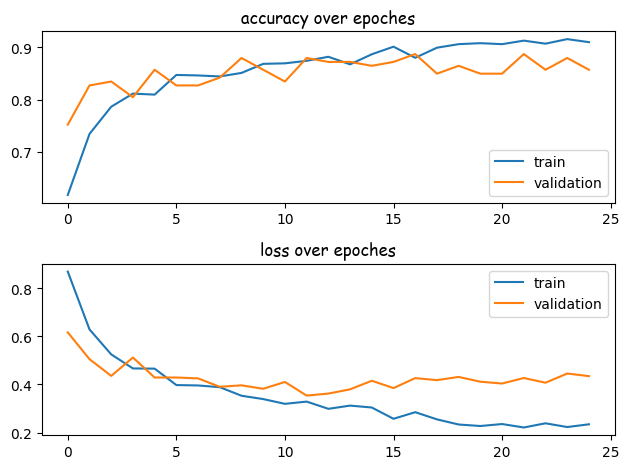

In [34]:
accuracy_loss_plot(histNadamNasNet)

##### RMSprop Optimizer

In [35]:
nasNet.set_weights(initial_weightsNasNet)
nasNet.compile(optimizer=keras.optimizers.RMSprop(learning_rate=learning_rate),
               loss='sparse_categorical_crossentropy',
               metrics=['accuracy'])
histRMSpropNasNet = nasNet.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epoches, batch_size=batch_size)

Epoch 1/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.5510 - loss: 1.2254 - val_accuracy: 0.7293 - val_loss: 0.6420
Epoch 2/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 27s 836ms/step - accuracy: 0.7133 - loss: 0.6961 - val_accuracy: 0.7669 - val_loss: 0.5941
Epoch 3/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 28s 838ms/step - accuracy: 0.7219 - loss: 0.6587 - val_accuracy: 0.8346 - val_loss: 0.4841
Epoch 4/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 28s 840ms/step - accuracy: 0.7624 - loss: 0.5590 - val_accuracy: 0.7444 - val_loss: 0.5806
Epoch 5/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 27s 826ms/step - accuracy: 0.7877 - loss: 0.5209 - val_accuracy: 0.8195 - val_loss: 0.5002
Epoch 6/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 28s 845ms/step - accuracy: 0.8136 - loss: 0.4834 - val_accuracy: 0.5263 - val_loss: 1.0228
Epoch 7/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 27s 821ms/step - accuracy: 0.7667 - loss: 0.5545 - val_accuracy: 0.8346 - val_loss: 0.4610
Epoch 8/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 25s 756ms/step - accuracy: 0.8299 - loss: 0.4448 - val_accurac

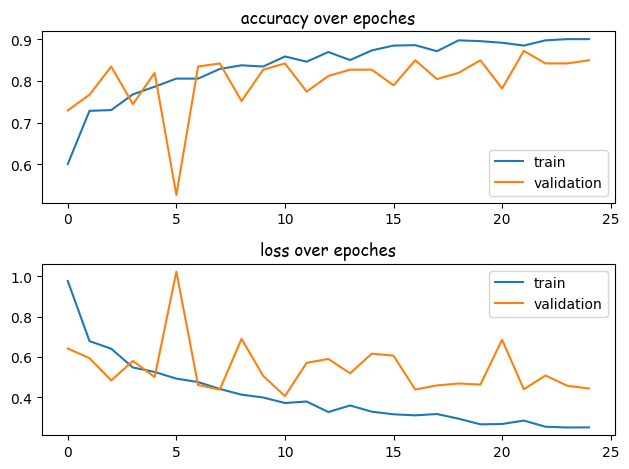

In [36]:
accuracy_loss_plot(histRMSpropNasNet)

---

<a name="3"></a>
## 3 - Results Analysis

#### ◆ MobileNetV2 With RMSprop Optimizer

In [37]:
X_test = (X_test / 255).astype(np.float32)

In [38]:
y_pred_MobileNetV2 = mobileNetV2.predict(X_test, verbose=0)
y_pred_classes_MobileNetV2 = np.argmax(y_pred_MobileNetV2, axis=1)

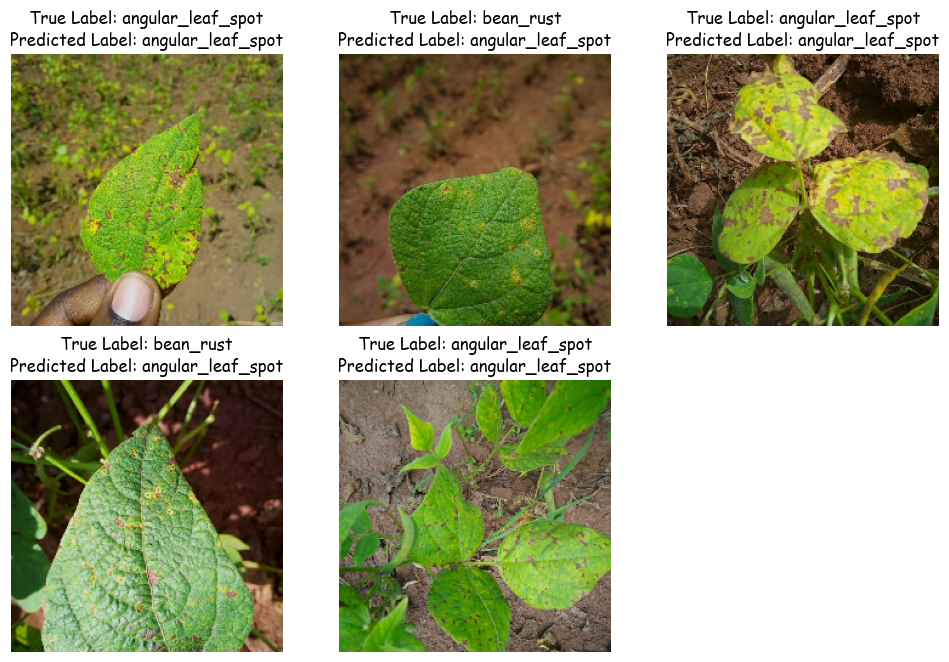

In [39]:
show_random_images(class_names, (X_test * 225).astype(np.uint8), y_test, y_pred_classes_MobileNetV2, label_flag=1)

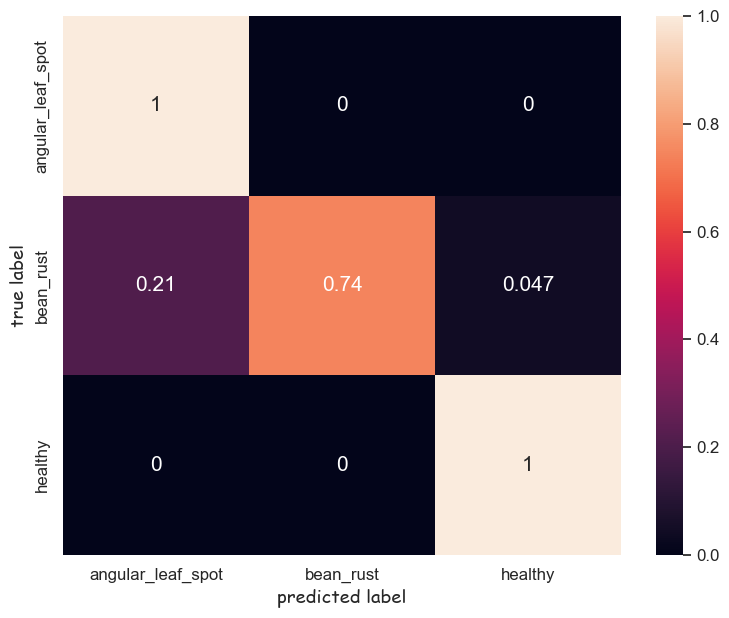

In [40]:
conf_mat = confusion_matrix(y_test, y_pred_classes_MobileNetV2)
conf_mat_MobileNetV2 = conf_mat.T / np.sum(conf_mat, axis=1)
plt.figure(figsize=(9, 7))
sns.set(font_scale=1.1) # for label size
sns.heatmap(conf_mat_MobileNetV2.T, xticklabels=class_names, yticklabels=class_names, annot=True, annot_kws={"size": 15})
plt.xlabel('predicted label', fontdict={'family':'cursive'})
plt.ylabel('true label', fontdict={'family':'cursive'})
plt.show()

#### ◆ EfficientNetB6 With RMSprop Optimizer

In [41]:
X_test = (X_test * 255).astype(np.uint8)

In [42]:
y_pred_EfficienNetB6 = efficientNetB6.predict(X_test, verbose=0)
y_pred_classes_EfficienNetB6 = np.argmax(y_pred_EfficienNetB6, axis=1)

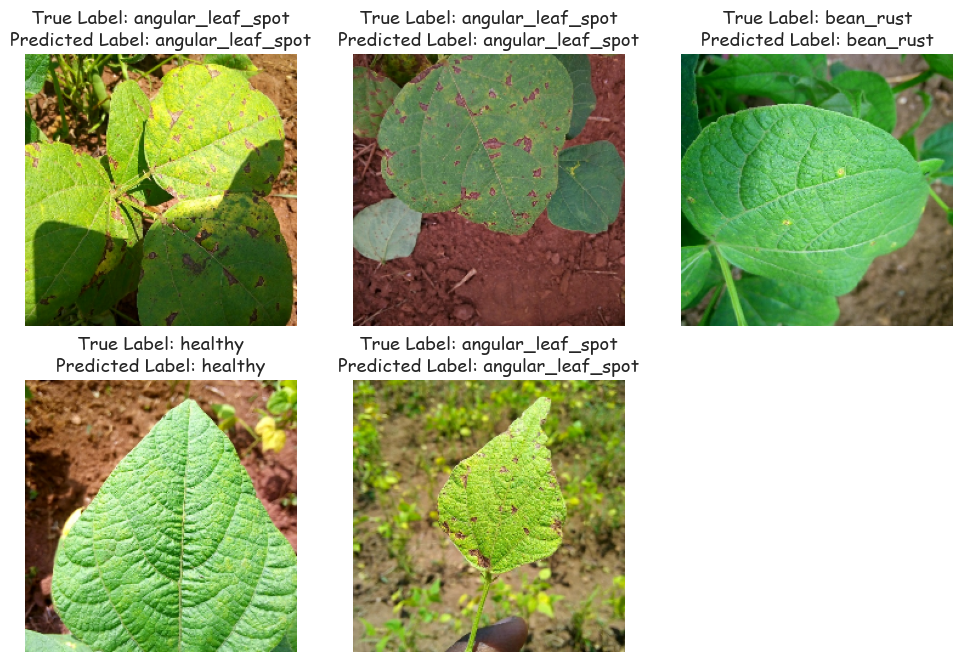

In [43]:
show_random_images(class_names, X_test, y_test, y_pred_classes_EfficienNetB6, label_flag=1)

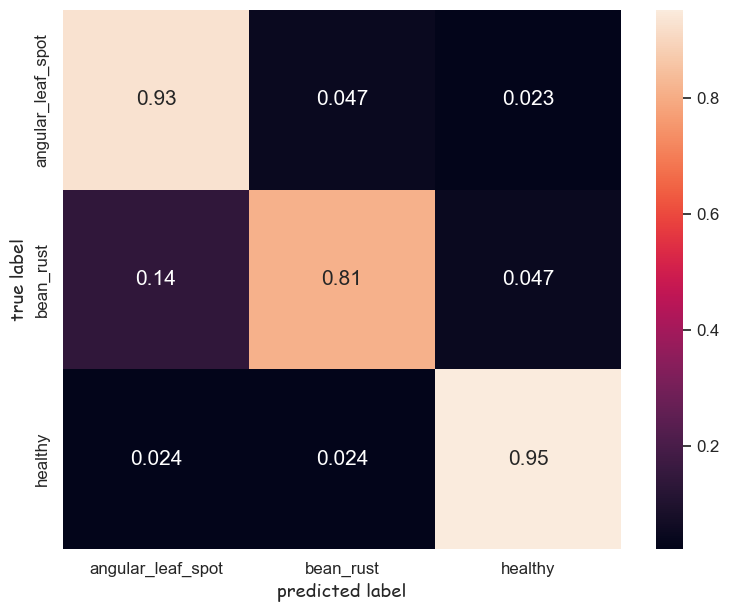

In [44]:
conf_mat = confusion_matrix(y_test, y_pred_classes_EfficienNetB6)
conf_mat_EfficienNetB6 = conf_mat.T / np.sum(conf_mat, axis=1)
plt.figure(figsize=(9, 7))
sns.set(font_scale=1.1) # for label size
sns.heatmap(conf_mat_EfficienNetB6.T, xticklabels=class_names, yticklabels=class_names, annot=True, annot_kws={"size": 15})
plt.xlabel('predicted label', fontdict={'family':'cursive'})
plt.ylabel('true label', fontdict={'family':'cursive'})
plt.show()

#### ◆ NasNet With RMSprop Optimizer

In [45]:
X_test = (X_test / 255).astype(np.float32)

In [46]:
y_pred_NasNet = nasNet.predict(X_test, verbose=0)
y_pred_classes_NasNet = np.argmax(y_pred_NasNet, axis=1)

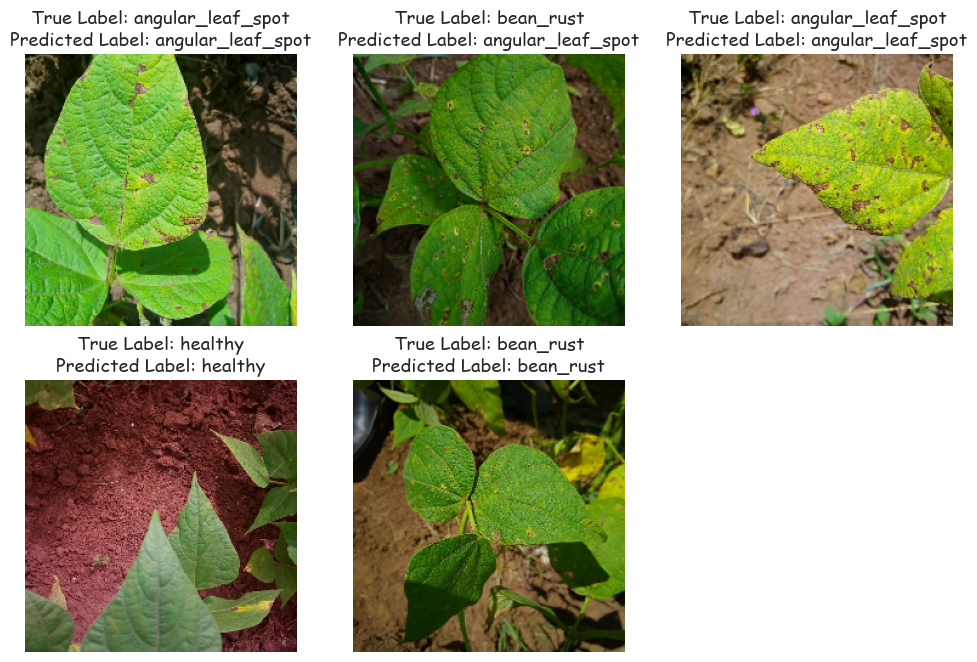

In [47]:
show_random_images(class_names, (X_test * 225).astype(np.uint8), y_test, y_pred_classes_NasNet, label_flag=1)

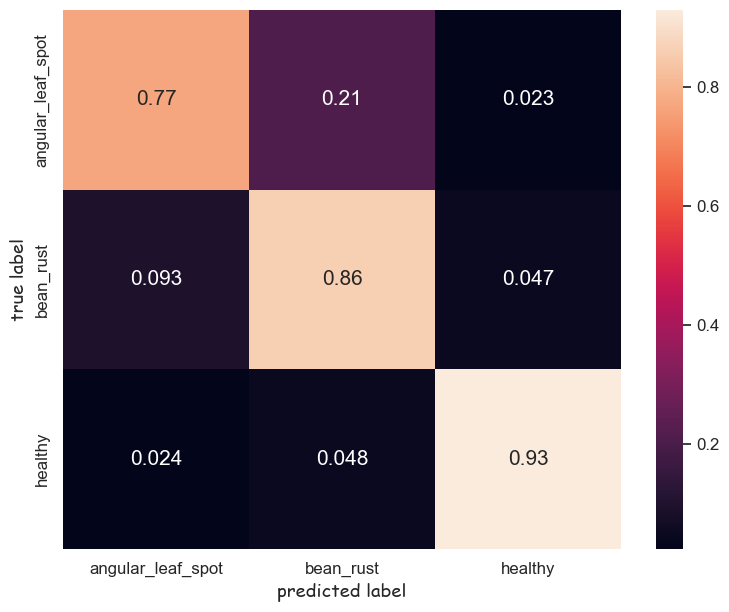

In [48]:
conf_mat = confusion_matrix(y_test, y_pred_classes_NasNet)
conf_mat_NasNet = conf_mat.T / np.sum(conf_mat, axis=1)
plt.figure(figsize=(9, 7))
sns.set(font_scale=1.1) # for label size
sns.heatmap(conf_mat_NasNet.T, xticklabels=class_names, yticklabels=class_names, annot=True, annot_kws={"size": 15})
plt.xlabel('predicted label', fontdict={'family':'cursive'})
plt.ylabel('true label', fontdict={'family':'cursive'})
plt.show()

---